<a href="https://colab.research.google.com/github/americasUnwanted/Python/blob/main/FashionMNIST2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git -C ssp19ai_utils pull
!git clone https://github.com/liady/ssp19ai_utils.git
import ssp19ai_utils.utils as utils
import importlib
importlib.reload(utils)
import tensorflow as tf 
from tensorflow import keras 
from tensorflow.keras.utils import to_categorical
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow.keras.datasets import mnist
import numpy as np
%matplotlib inline


Already up to date.
fatal: destination path 'ssp19ai_utils' already exists and is not an empty directory.


In [2]:
fashion_mnist = keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

In [3]:
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

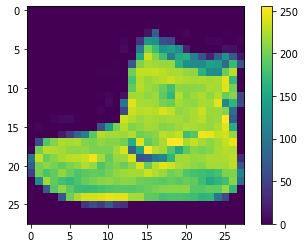

the label is: 9


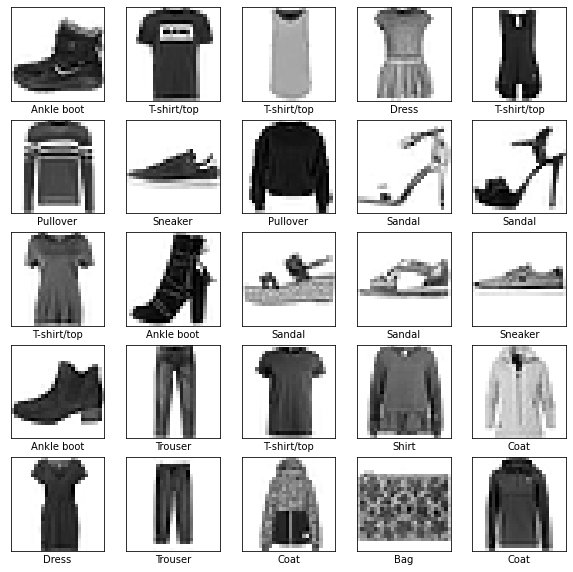

In [4]:
utils.plot_image(train_images, train_labels, cmap=None)

train_images = train_images/255.0
test_images = test_images/255.0

utils.plot_multi_images(train_images, train_labels, class_names)

In [5]:
model = keras.Sequential([
    keras.layers.Flatten(input_shape=(28, 28)),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(4096, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [6]:
utils.draw_model(model)

In [7]:
history = model.fit(train_images, train_labels, validation_split=0.25, epochs=5)

Epoch 1/5
1407/1407 [==============================] - 20s 14ms/step - loss: 0.6678 - accuracy: 0.7857 - val_loss: 0.4626 - val_accuracy: 0.8351
Epoch 2/5
1407/1407 [==============================] - 18s 13ms/step - loss: 0.4207 - accuracy: 0.8516 - val_loss: 0.4097 - val_accuracy: 0.8537
Epoch 3/5
1407/1407 [==============================] - 18s 13ms/step - loss: 0.3737 - accuracy: 0.8666 - val_loss: 0.3720 - val_accuracy: 0.8691
Epoch 4/5
1407/1407 [==============================] - 18s 13ms/step - loss: 0.3455 - accuracy: 0.8739 - val_loss: 0.3677 - val_accuracy: 0.8680
Epoch 5/5
1407/1407 [==============================] - 18s 13ms/step - loss: 0.3219 - accuracy: 0.8827 - val_loss: 0.3590 - val_accuracy: 0.8725


In [8]:
test_loss, test_acc = model.evaluate(test_images, test_labels)

print('Test accuracy:', test_acc)

313/313 [==============================] - 2s 6ms/step - loss: 0.3831 - accuracy: 0.8660
Test accuracy: 0.8659999966621399


In [9]:
predictions = model.predict(test_images)

predictions[0].argmax()

9

In [10]:
# 16.7: With adding 4096 neurons, the prediction accuracy stays at 9, but the test accuracy goes from 0.87020 to 
# 0.8632 which is slioghtly lower and a slighly longer fit lasting 18-19 sec for each one.